In [1]:
import earthnet_minicuber as emc
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import datetime
import folium
import xarray as xr
import rioxarray as rioxr
cmap_veg = clr.LinearSegmentedColormap.from_list('veg', ['#ffffe5','#f7fcb9','#d9f0a3','#addd8e','#78c679','#41ab5d','#238443','#006837','#004529'])

In [2]:
# Hide warnings (many since some xarray class uses some deprecated python function on 3.9)
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import xarray as xr
import numpy as np
from skimage.metrics import structural_similarity as ssim
import seaborn as sns

def ssim_wrapper(img1, img2):
    return ssim(img1, img2, data_range=2.0)

def calculate_metrics(input_nc, reference_nc, roi_lat=None, roi_lon=None, subsampling_factor=1):
    cloud_threshold = 0.2
    input_ndvi = xr.open_dataset(input_nc)["ndvi_pred"]
    reference = xr.open_dataset(reference_nc)
    reference_B4 = reference["s2_B04"]
    dates = reference.time.values
    
    for i in range(5): 
        if not reference_B4.sel(time=dates[i]).isnull().all().item():
            offset = i
            break
    
    for i in range(dates.size):
        if i < offset:
            reference = reference.drop_sel(time=dates[i])
        else:
            offset += 5
            if offset <55:
                reference = reference.drop_sel(time=dates[i])   

    reference["ndvi"] = (("time", "x", "y"), np.zeros((20, 128, 128)))
    reference["ndvi"] = (reference["s2_B8A"] - reference["s2_B04"]) / xr.where((reference["s2_B8A"] + reference["s2_B04"]) == 0, np.nan, (reference["s2_B8A"] + reference["s2_B04"]))
    
    masked = reference.where(reference["s2_dlmask"] == 0)
    reference_ndvi = masked["ndvi"]
    ssim_reference_ndvi = reference_ndvi.fillna(reference_ndvi.mean(dim=("lat", "lon"), skipna=True))
    residuals = input_ndvi - reference_ndvi

    U = np.sqrt((residuals**2).mean(dim=("lat", "lon"))) #RMSE
    A = (residuals).mean(dim=("lat", "lon"))
    P = np.sqrt(((residuals - A)**2).mean(dim=("lat", "lon")))
    R = xr.corr(input_ndvi, reference_ndvi, dim=("lat", "lon"))
    SSIM = xr.apply_ufunc(
        ssim_wrapper,
        input_ndvi,
        ssim_reference_ndvi,
        input_core_dims=[["lat","lon"], ["lat","lon"]],
        vectorize=True,
        output_dtypes=[float]
    )

    cloud = (reference["s2_dlmask"] == 0).sum(dim=["lat", "lon"]) <= (128*128*(1-cloud_threshold))
    for i in range(20):
        if cloud[i].item():
            U[i] = np.nan
            A[i] = np.nan
            P[i] = np.nan
            R[i] = np.nan
            # SSIM[i] = np.nan

    return {
        "Uncertainty": U,
        "Accuracy": A,
        "Precision": P,
        "Pearson Correlation": R,
        "SSIM": SSIM
    }

def plot_metrics():
    pass


input = r"E:\DZ\predictions\contextformer6M_seed42\MJJ21\minicube_225_34TET_47.37_22.05.nc"
reference = r"E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_225_34TET_47.37_22.05.nc"
print(calculate_metrics(input, reference)["SSIM"])
# mc = xr.open_dataset(reference)
# mc
# emc.plot_rgb(mc.rename({"s2_dlmask":"s2_mask"}), mask=False)



<xarray.DataArray (time: 20)> Size: 160B
array([ 3.47940093e-01,  9.20167376e-01,  8.90159547e-01,  1.56844227e-03,
        8.83601196e-01,  8.81223490e-01, -1.97092625e-02,  8.18369948e-01,
        6.19430231e-01,  5.22742194e-01,  2.82289673e-01,  3.69477979e-01,
        5.19562899e-01,  4.88670698e-01,  6.19425267e-01,  6.55647992e-01,
        1.77005596e-04,  2.82316209e-01,  6.27203591e-01,  4.75067059e-01])
Coordinates:
  * time                 (time) datetime64[ns] 160B 2021-05-01 ... 2021-08-04
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...


In [7]:

xr.open_dataset(r"E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_0_29SND_39.29_-8.56.nc")


<xarray.Dataset> Size: 119MB
Dimensions:              (time: 150, lon: 128, lat: 128)
Coordinates:
  * time                 (time) datetime64[ns] 1kB 2021-03-11 ... 2021-08-07
  * lon                  (lon) float64 1kB -8.571 -8.571 ... -8.542 -8.542
  * lat                  (lat) float64 1kB 39.3 39.3 39.3 ... 39.28 39.28 39.28
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...
Data variables: (12/21)
    s2_SCL               (time, lat, lon) float64 20MB ...
    s2_avail             (time) float64 1kB ...
    s2_B02               (time, lat, lon) float64 20MB ...
    s2_B03               (time, lat, lon) float64 20MB ...
    s2_B04               (time, lat, lon) float64 20MB ...
    s2_B8A               (time, lat, lon) float64 20MB ...
    ...                   ...
    eobs_rr              (time) float64 1kB ...
    eobs_tg              (time) float64 1kB ...
    eobs_tn              (time) float64 1kB ...
    eobs_tx              (time) float64 1kB ...
    s2_dlmask            (time, lat, lon) float64 20MB ...
    eobs_fgv26           (time) float64 1kB ...
Attributes:
    dataset_name:        EarthNet2021x
    dataset_name_short:  en21x
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2021x dataset, a...
    provided_by:         Max-Planck-Institute for Biogeochemistry

In [2]:
import rioxarray
import xarray as xr
import numpy as np

def select_inside_center(offset_ds, ref_ds, var='ndvi_pred'):
    """
    Select only the pixels of offset_ds that lie within the bounding box of ref_ds.
    Returns a DataArray.
    """
    da = offset_ds[var]
    lat_min = float(ref_ds[var].lat.min())
    lat_max = float(ref_ds[var].lat.max())
    lon_min = float(ref_ds[var].lon.min())
    lon_max = float(ref_ds[var].lon.max())

    da_cropped = da.where(
        (da.lat >= lat_min) & (da.lat <= lat_max) &
        (da.lon >= lon_min) & (da.lon <= lon_max),
        drop=True
    )
    return da_cropped

center = r"E:\DZ\reproduced_predictions\spain_no_offset.nc"
ne = r"E:\DZ\reproduced_predictions\spain_NW_offset.nc"
nw = r"E:\DZ\reproduced_predictions\spain_NE_offset.nc"
se = r"E:\DZ\reproduced_predictions\spain_SE_offset.nc"
sw = r"E:\DZ\reproduced_predictions\spain_SW_offset.nc"

files = [center, ne, nw, se, sw]

datasets = [xr.open_dataset(f) for f in files]
ref_ds = datasets[0]
ref_da = ref_ds['ndvi_pred']
cropped_offsets = [select_inside_center(ds, ref_ds) for ds in datasets]  # returns DataArrays
aligned_offsets = [
    da.interp(lat=ref_da.lat, lon=ref_da.lon)
    for da in cropped_offsets
]

all_da = [ref_da] + aligned_offsets
stack = np.stack([da.values for da in all_da], axis=0)  # stack values of DataArrays
mean_values = np.nanmean(stack, axis=0)
mean_da = xr.DataArray(mean_values, dims=ref_da.dims, coords=ref_da.coords)
mean_ds = mean_da.to_dataset(name='ndvi_pred')
mean_ds.to_netcdf("C:/Users/dozhang/Downloads/spain_averaged.nc")



In [12]:
# ds = xr.open_dataset(r"E:\DZ\reproduced_predictions\romania_NW_offset.nc")
ds = xr.open_dataset(r"C:/Users/dozhang/Downloads/test.nc")
print(ds)
print(ds.data_vars)

<xarray.Dataset> Size: 1MB
Dimensions:    (time: 20, lon: 128, lat: 128)
Coordinates:
  * time       (time) datetime64[ns] 160B 2021-05-01 2021-05-06 ... 2021-08-04
  * lon        (lon) float64 1kB 22.03 22.03 22.03 22.03 ... 22.07 22.07 22.07
  * lat        (lat) float64 1kB 47.38 47.38 47.38 47.38 ... 47.36 47.36 47.36
Data variables:
    ndvi_pred  (time, lat, lon) float32 1MB ...
Data variables:
    ndvi_pred  (time, lat, lon) float32 1MB ...


In [1]:
import earthnet_minicuber as emc
import xarray as xr

bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (-2.23, 42.08), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-03-09/2021-08-06",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": False,
                "five_daily_filter": True,
                "brdf_correction": False,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

            # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
            # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n40w005.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}
# cube = emc.Minicuber.save_minicube(specs,"C:/Users/dozhang/Downloads/MJJ21_replicated_minicube_32_30TWM_42.08_-2.23.nc")
spain = emc.load_minicube(specs, compute = True)
spain = spain.drop_sel(time="2021-03-09T00:00:00")

if "s2_mask" in list(spain.variables) and ("s2_dlmask" not in list(spain.variables)):
    spain = spain.rename({"s2_mask": "s2_dlmask"})

if "angle" in list(spain.variables):
    spain = spain.drop_vars(["angle"])

# spain

# emc.Minicuber.save_minicube_netcdf(spain, "C:/Users/dozhang/Downloads/spain_no_offset.nc")
# emc.Minicuber.save_minicube_netcdf(spain, "C:/Users/dozhang/Downloads/spain_NE_offset.nc")
# emc.Minicuber.save_minicube_netcdf(spain, "C:/Users/dozhang/Downloads/spain_NW_offset.nc")
# emc.Minicuber.save_minicube_netcdf(spain, "C:/Users/dozhang/Downloads/spain_SE_offset.nc")
emc.Minicuber.save_minicube_netcdf(spain, "C:/Users/dozhang/Downloads/spain_SW_offset.nc")


# north = spain.isel(lat=slice(0,-2), lon=slice(1,-1))
# south = spain.isel(lat=slice(2, None), lon=slice(1,-1))
# east = spain.isel(lat=slice(1,-1), lon=slice(2, None))
# west = spain.isel(lat=slice(1,-1), lon=slice(0,-2))
# emc.Minicuber.save_minicube_netcdf(north, "C:/Users/dozhang/Downloads/MJJ21spain_north_offset.nc")
# emc.Minicuber.save_minicube_netcdf(south, "C:/Users/dozhang/Downloads/MJJ21spain_south_offset.nc")
# emc.Minicuber.save_minicube_netcdf(east, "C:/Users/dozhang/Downloads/MJJ21spain_east_offset.nc")
# emc.Minicuber.save_minicube_netcdf(west, "C:/Users/dozhang/Downloads/MJJ21spain_west_offset.nc")

Loading Sentinel2 for 2021-03-09/2021-03-31
Loading EOBS for 2021-03-09/2021-03-31
Loading Sentinel2 for 2021-04-01/2021-04-30
Loading EOBS for 2021-04-01/2021-04-30
Loading Sentinel2 for 2021-05-01/2021-05-31
Loading EOBS for 2021-05-01/2021-05-31
Loading Sentinel2 for 2021-06-01/2021-06-30
Loading EOBS for 2021-06-01/2021-06-30
Loading Sentinel2 for 2021-07-01/2021-08-06
Loading EOBS for 2021-07-01/2021-08-06
Loading NASADEM
Loading ALOSWorld
Loading Copernicus30
Loading ESAWorldcover
Loading Geomorphons


In [ ]:
ds_original = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\MJJ21_replicated_minicube_32_30TWM_42.08_-2.23.nc")
ds_north = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\MJJ21_spain_north_offset.nc")
ds_south = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\MJJ21_spain_south_offset.nc")
ds_east = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\MJJ21_spain_east_offset.nc")
ds_west = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\MJJ21_spain_west_offset.nc")


def nanify_offset(ds, direction, var='ndvi_pred'):
    da = ds.copy()[var]

    # Dynamic axis indices
    lat_axis = da.get_axis_num('lat')
    lon_axis = da.get_axis_num('lon')

    # Check coordinate ordering
    lat_descending = ds.lat[0] > ds.lat[-1]   # True if first lat is larger (top = north)
    lon_descending = ds.lon[0] > ds.lon[-1]   # True if first lon is larger (left = east)

    # Prepare full slices for all axes
    indexer = [slice(None)] * da.ndim

    if direction == "north":
        indexer[lat_axis] = 0 if lat_descending else -1
    elif direction == "south":
        indexer[lat_axis] = -1 if lat_descending else 0
    elif direction == "east":
        indexer[lon_axis] = 0 if lon_descending else -1
    elif direction == "west":
        indexer[lon_axis] = -1 if lon_descending else 0

    # Replace values with NaN across all timesteps
    da.values[tuple(indexer)] = np.nan
    ds[var] = da
    return ds


# offsets, cropped to match original
ds_north = nanify_offset(ds_north, "north")  # drop first row
ds_south = nanify_offset(ds_south, "south")  # drop last row
ds_east = nanify_offset(ds_east, "east")      # drop first column
ds_west = nanify_offset(ds_west, "west")      # drop last column

datasets = [ds_original, ds_north, ds_south, ds_east, ds_west]

arrays = [ds['ndvi_pred'].values.astype('float32') for ds in datasets]
stack = np.stack(arrays, axis=0)  # shape: (n_offsets+1, time, y, x)
mean = np.nanmean(stack, axis=0)  # shape: (time, 128, 128)
mean_da = xr.DataArray(mean, dims=ds_original['ndvi_pred'].dims, coords=ds_original['ndvi_pred'].coords)
mean_ds = mean_da.to_dataset(name='ndvi_pred')
mean_ds.to_netcdf("E:/DZ/reproduced_predictions/ood-t_chopped/pixel_offset_average_MJJ21_replicated_minicube_32_30TWM_42.08_-2.23.nc")



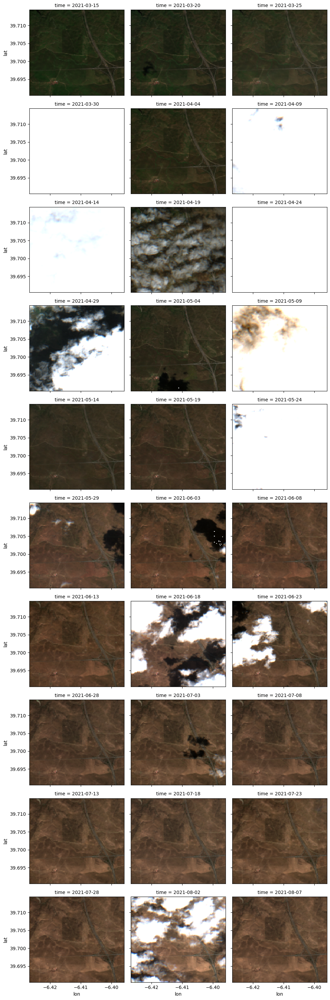

In [23]:
mctest  = xr.open_dataset(r"E:\DZ\shrub_dominated\ood-t_chopped\minicube_26_30TTK_39.70_-6.41_f0.00_c0.01_s0.95.nc")
emc.plot_rgb(mctest, mask=False)

In [ ]:
t = xr.open_dataset(r"C:/Users/dozhang/Downloads/MJJ21spain_east_offset.nc")
# emc.plot_rgb(t, mask=False)
t

<xarray.Dataset> Size: 119MB
Dimensions:    (time: 150, lon: 128, lat: 128)
Coordinates:
  * time       (time) datetime64[ns] 1kB 2021-03-09 2021-03-10 ... 2021-08-06
  * lon        (lon) float64 1kB -2.245 -2.245 -2.245 ... -2.215 -2.214 -2.214
  * lat        (lat) float64 1kB 42.09 42.09 42.09 42.09 ... 42.07 42.07 42.07
Data variables: (12/20)
    s2_SCL     (time, lat, lon) float64 20MB ...
    s2_dlmask  (time, lat, lon) float64 20MB ...
    s2_avail   (time) float64 1kB ...
    s2_B02     (time, lat, lon) float64 20MB ...
    s2_B03     (time, lat, lon) float64 20MB ...
    s2_B04     (time, lat, lon) float64 20MB ...
    ...         ...
    eobs_qq    (time) float64 1kB ...
    nasa_dem   (lat, lon) float64 131kB ...
    alos_dem   (lat, lon) float64 131kB ...
    cop_dem    (lat, lon) float64 131kB ...
    esawc_lc   (lat, lon) float64 131kB ...
    geom_cls   (lat, lon) float64 131kB ...
Attributes:
    history:  Created on 2025-11-21 06:45:21.698008 with the earthnet-minicub...

In [50]:
def convert_nc_to_tiff(nc_file, out_dir):
    # Load the NetCDF file using xarray
    filename = nc_file.split("/")[-1].replace(".nc", "")
    if out_dir[1] != '/':
        out_dir = out_dir + '/'

    ds = xr.open_dataset(nc_file).rename({"lat": "y", "lon": "x"})
    timestep = ds.time.min().values

    for i in range(ds.sizes["time"]):
        ndvi = ds.sel(time=timestep)
        ndvi = ndvi.rio.write_crs("EPSG:4326") 
        ndvi = ndvi.rio.to_raster(f"{out_dir}{filename}_{i+1}.tiff")
        timestep = timestep + np.timedelta64(5, 'D')


    print(f"Converted {nc_file} to tiff file")
    return

convert_nc_to_tiff("E:/DZ/predictions/contextformer6M_seed42/JAS21/minicube_0_29SND_39.29_-8.56.nc", "C:/Users/dozhang/Downloads/location1")

Converted E:/DZ/predictions/contextformer6M_seed42/JAS21/minicube_0_29SND_39.29_-8.56.nc to tiff file


In [51]:
def minicube_to_tiff(nc_file, out_dir):
    filename = nc_file.split("/")[-1].replace(".nc", "")
    if out_dir[1] != '/':
        out_dir = out_dir + '/'
    ds = xr.open_dataset(nc_file).rename({"lat": "y", "lon": "x"})
    ds["nasa_dem"].rio.write_crs("EPSG:4326").rio.to_raster(f"{out_dir}{filename}_nasa_dem.tiff")
    ds["esawc_lc"].rio.write_crs("EPSG:4326").rio.to_raster(f"{out_dir}{filename}_esawc.tiff") 
    
    return

minicube_to_tiff("C:/Users/dozhang/Documents/GitHub/greenearthnet/development/greenearthnet/replicated_minicubes/JAS2021_replicated_minicube_0_29SND_39.29_-8.56.nc", "C:/Users/dozhang/Downloads/location1")

In [26]:
tif = rioxr.open_rasterio("C:/Users/dozhang/Downloads/geom_90M_n45e020.tif")
tif

<xarray.DataArray (band: 1, y: 6000, x: 6000)> Size: 36MB
[36000000 values with dtype=uint8]
Coordinates:
  * band         (band) int32 4B 1
  * x            (x) float64 48kB 20.0 20.0 20.0 20.0 ... 25.0 25.0 25.0 25.0
  * y            (y) float64 48kB 50.0 50.0 50.0 50.0 ... 45.0 45.0 45.0 45.0
    spatial_ref  int32 4B 0
Attributes:
    TIFFTAG_IMAGEDESCRIPTION:  geom geomorphometry variable derived from MERI...
    TIFFTAG_DATETIME:          2019
    TIFFTAG_ARTIST:            Giuseppe Amatulli (giuseppe.amatulli@gmail.com)
    AREA_OR_POINT:             Area
    _FillValue:                0
    scale_factor:              1.0
    add_offset:                0.0

In [4]:
bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (22.05, 47.37), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-03-12/2021-08-04",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": False,
                "five_daily_filter": True,
                "brdf_correction": False,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

            # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
            # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n45e020.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}

In [5]:
# cube = emc.load_minicube(specs, compute = True)
# path = "E:\DZ\greenearthnet\ood-t_chopped\JAS21\minicube_0_29SND_39.29_-8.56.nc"
path = "E:\DZ\greenearthnet\ood-t_chopped\MAM21\minicube_225_34TET_47.37_22.05.nc"
# path = "C:/Users/dozhang/Downloads/MJJ_reproduced_minicube_225_34TET_47.37_22.05.nc"
# path = "E:\DZ\predictions\contextformer6M_seed42\JAS21\minicube_0_29SND_39.29_-8.56.nc"
test = xr.open_dataset(path)
test

<xarray.Dataset> Size: 119MB
Dimensions:              (time: 150, lon: 128, lat: 128)
Coordinates:
  * time                 (time) datetime64[ns] 1kB 2021-01-07 ... 2021-06-05
  * lon                  (lon) float64 1kB 22.03 22.03 22.03 ... 22.07 22.07
  * lat                  (lat) float64 1kB 47.38 47.38 47.38 ... 47.35 47.35
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...
Data variables: (12/21)
    s2_SCL               (time, lat, lon) float64 20MB ...
    s2_avail             (time) float64 1kB ...
    s2_B02               (time, lat, lon) float64 20MB ...
    s2_B03               (time, lat, lon) float64 20MB ...
    s2_B04               (time, lat, lon) float64 20MB ...
    s2_B8A               (time, lat, lon) float64 20MB ...
    ...                   ...
    eobs_rr              (time) float64 1kB ...
    eobs_tg              (time) float64 1kB ...
    eobs_tn              (time) float64 1kB ...
    eobs_tx              (time) float64 1kB ...
    s2_dlmask            (time, lat, lon) float64 20MB ...
    eobs_fgv26           (time) float64 1kB ...
Attributes:
    dataset_name:        EarthNet2021x
    dataset_name_short:  en21x
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2021x dataset, a...
    provided_by:         Max-Planck-Institute for Biogeochemistry

In [62]:
input

<xarray.Dataset> Size: 119MB
Dimensions:              (time: 150, lon: 128, lat: 128)
Coordinates:
  * time                 (time) datetime64[ns] 1kB 2021-03-08 ... 2021-08-04
  * lon                  (lon) float64 1kB 22.03 22.03 22.03 ... 22.07 22.07
  * lat                  (lat) float64 1kB 47.38 47.38 47.38 ... 47.35 47.35
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...
Data variables: (12/21)
    s2_SCL               (time, lat, lon) float64 20MB ...
    s2_avail             (time) float64 1kB nan nan nan nan ... nan nan nan 1.0
    s2_B02               (time, lat, lon) float64 20MB ...
    s2_B03               (time, lat, lon) float64 20MB ...
    s2_B04               (time, lat, lon) float64 20MB ...
    s2_B8A               (time, lat, lon) float64 20MB ...
    ...                   ...
    eobs_rr              (time) float64 1kB ...
    eobs_tg              (time) float64 1kB ...
    eobs_tn              (time) float64 1kB ...
    eobs_tx              (time) float64 1kB ...
    s2_dlmask            (time, lat, lon) float64 20MB ...
    eobs_fgv26           (time) float64 1kB ...
Attributes:
    dataset_name:        EarthNet2021x
    dataset_name_short:  en21x
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2021x dataset, a...
    provided_by:         Max-Planck-Institute for Biogeochemistry

In [35]:
cube = cube.drop_vars(["angle"])

In [6]:
cube

<xarray.Dataset> Size: 115MB
Dimensions:   (time: 146, lon: 128, lat: 128)
Coordinates:
  * time      (time) datetime64[ns] 1kB 2021-03-12 2021-03-13 ... 2021-08-04
  * lon       (lon) float64 1kB 22.03 22.03 22.03 22.03 ... 22.07 22.07 22.07
  * lat       (lat) float64 1kB 47.38 47.38 47.38 47.38 ... 47.36 47.36 47.36
Data variables: (12/20)
    s2_SCL    (time, lat, lon) float64 19MB 5.0 5.0 5.0 7.0 ... 7.0 7.0 2.0 2.0
    s2_mask   (time, lat, lon) float64 19MB 0.0 0.0 0.0 0.0 ... 3.0 3.0 3.0 3.0
    s2_avail  (time) float32 584B 1.0 nan nan nan nan ... nan nan nan nan 1.0
    s2_B02    (time, lat, lon) float64 19MB 0.04023 0.03408 ... 0.05452 0.05095
    s2_B03    (time, lat, lon) float64 19MB 0.05117 0.044 ... 0.0601 0.05792
    s2_B04    (time, lat, lon) float64 19MB 0.07044 0.0599 ... 0.06783 0.06536
    ...        ...
    eobs_qq   (time) float32 584B 201.0 190.0 171.0 87.0 ... 223.0 262.0 303.0
    nasa_dem  (lat, lon) float64 131kB 134.0 133.4 132.4 ... 106.8 107.3 106.8
    alos_dem  (lat, lon) float64 131kB 133.7 132.4 131.7 ... 108.4 109.0 108.6
    cop_dem   (lat, lon) float64 131kB 132.5 132.0 131.7 ... 105.7 105.8 105.9
    esawc_lc  (lat, lon) float32 66kB 40.0 40.0 40.0 40.0 ... 40.0 40.0 40.0
    geom_cls  (lat, lon) float32 66kB 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
Attributes:
    history:  Created on 2025-09-30 22:26:53.407912 with the earthnet-minicub...

In [20]:
# input = xr.open_dataset("E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_225_34TET_47.37_22.05.nc")
# emc.plot_rgb(input, mask=True)
# emc.plot_rgb(cube, mask=True)
# test = xr.open_dataset("E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_227_34TFL_40.83_22.37.nc")
# test = xr.open_dataset("E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_225_34TET_47.37_22.05.nc")
test = xr.open_dataset("E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_241_34VCL_59.04_17.96.nc")
test
# emc.plot_rgb(test, mask=False)
# input = xr.open_dataset("C:/Users/dozhang/Documents/GitHub/greenearthnet/development/greenearthnet/replicated_minicubes/MJJ_reproduced_minicube_225_34TET_47.37_22.05.nc")
# input

<xarray.Dataset> Size: 119MB
Dimensions:              (time: 150, lon: 128, lat: 128)
Coordinates:
  * time                 (time) datetime64[ns] 1kB 2021-03-10 ... 2021-08-06
  * lon                  (lon) float64 1kB 17.93 17.93 17.93 ... 17.98 17.98
  * lat                  (lat) float64 1kB 59.06 59.06 59.06 ... 59.03 59.03
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...
Data variables: (12/21)
    s2_SCL               (time, lat, lon) float64 20MB ...
    s2_avail             (time) float64 1kB ...
    s2_B02               (time, lat, lon) float64 20MB ...
    s2_B03               (time, lat, lon) float64 20MB ...
    s2_B04               (time, lat, lon) float64 20MB ...
    s2_B8A               (time, lat, lon) float64 20MB ...
    ...                   ...
    eobs_rr              (time) float64 1kB ...
    eobs_tg              (time) float64 1kB ...
    eobs_tn              (time) float64 1kB ...
    eobs_tx              (time) float64 1kB ...
    s2_dlmask            (time, lat, lon) float64 20MB ...
    eobs_fgv26           (time) float64 1kB ...
Attributes:
    dataset_name:        EarthNet2021x
    dataset_name_short:  en21x
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2021x dataset, a...
    provided_by:         Max-Planck-Institute for Biogeochemistry

### If instead of on-the-fly, you prefer to save the minicube to disk:

Loading Sentinel2 for 2021-05-10/2021-05-31
Loading EOBS for 2021-05-10/2021-05-31
Loading Sentinel2 for 2021-06-01/2021-06-30
Loading EOBS for 2021-06-01/2021-06-30
Loading Sentinel2 for 2021-07-01/2021-07-31
Loading EOBS for 2021-07-01/2021-07-31
Loading Sentinel2 for 2021-08-01/2021-08-31
Loading EOBS for 2021-08-01/2021-08-31
Loading Sentinel2 for 2021-09-01/2021-10-06
Loading EOBS for 2021-09-01/2021-10-06
Loading NASADEM
Loading ALOSWorld
Loading Copernicus30
Loading ESAWorldcover
Loading Geomorphons


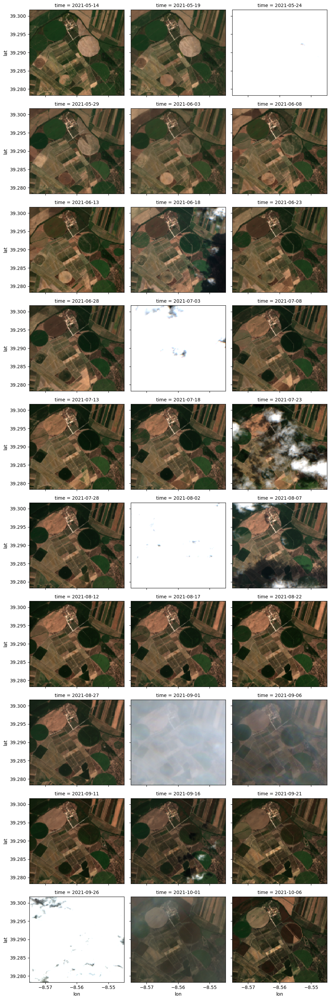

In [12]:
bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (-8.56, 39.29), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-05-10/2021-10-06",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": True,
                "five_daily_filter": False,
                "brdf_correction": True,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

            # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
            # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n35w010.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}
# cube = emc.Minicuber.save_minicube(specs,"C:/Users/dozhang/Downloads/JAS_replicated_minicube_0_29SND_39.29_-8.56.nc")
portugal = emc.load_minicube(specs, compute = True)
emc.plot_rgb(portugal, mask=False)

In [2]:
bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (22.05, 47.37), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-03-07/2021-08-04",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": False,
                "five_daily_filter": True,
                "brdf_correction": False,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

            # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
            # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n45e020.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}
# cube = emc.Minicuber.save_minicube(specs,"C:/Users/dozhang/Downloads/MJJ_replicated_minicube_225_34TET_47.37_22.05.nc")
romania = emc.load_minicube(specs, compute = True)
romania = romania.drop_sel(time="2021-03-07T00:00:00")

if "s2_mask" in list(romania.variables) and ("s2_dlmask" not in list(romania.variables)):
    romania = romania.rename({"s2_mask": "s2_dlmask"})

if "angle" in list(romania.variables):
    romania = romania.drop_vars(["angle"])

# emc.Minicuber.save_minicube_netcdf(romania, "C:/Users/dozhang/Downloads/romania_no_offset.nc")
# emc.Minicuber.save_minicube_netcdf(romania, "C:/Users/dozhang/Downloads/romania_NE_offset.nc")
# emc.Minicuber.save_minicube_netcdf(romania, "C:/Users/dozhang/Downloads/romania_NW_offset.nc")
# emc.Minicuber.save_minicube_netcdf(romania, "C:/Users/dozhang/Downloads/romania_SE_offset.nc")
emc.Minicuber.save_minicube_netcdf(romania, "C:/Users/dozhang/Downloads/romania_SW_offset.nc")

# north = romania.isel(lat=slice(0,-2), lon=slice(1,-1))
# south = romania.isel(lat=slice(2, None), lon=slice(1,-1))
# east = romania.isel(lat=slice(1,-1), lon=slice(2, None))
# west = romania.isel(lat=slice(1,-1), lon=slice(0,-2))
# emc.Minicuber.save_minicube_netcdf(north, "C:/Users/dozhang/Downloads/romania_north_offset.nc")
# emc.Minicuber.save_minicube_netcdf(south, "C:/Users/dozhang/Downloads/romania_south_offset.nc")
# emc.Minicuber.save_minicube_netcdf(east, "C:/Users/dozhang/Downloads/romania_east_offset.nc")
# emc.Minicuber.save_minicube_netcdf(west, "C:/Users/dozhang/Downloads/romania_west_offset.nc")

Loading Sentinel2 for 2021-03-07/2021-03-31
Loading EOBS for 2021-03-07/2021-03-31
Loading Sentinel2 for 2021-04-01/2021-04-30
Loading EOBS for 2021-04-01/2021-04-30
Loading Sentinel2 for 2021-05-01/2021-05-31
Loading EOBS for 2021-05-01/2021-05-31
Loading Sentinel2 for 2021-06-01/2021-06-30
Loading EOBS for 2021-06-01/2021-06-30
Loading Sentinel2 for 2021-07-01/2021-08-04
Loading EOBS for 2021-07-01/2021-08-04
Loading NASADEM
Loading ALOSWorld
Loading Copernicus30
Loading ESAWorldcover
Loading Geomorphons


In [1]:
import earthnet_minicuber as emc
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import datetime
import folium
import xarray as xr
import rioxarray as rioxr
cmap_veg = clr.LinearSegmentedColormap.from_list('veg', ['#ffffe5','#f7fcb9','#d9f0a3','#addd8e','#78c679','#41ab5d','#238443','#006837','#004529'])
# Hide warnings (many since some xarray class uses some deprecated python function on 3.9)
import warnings
warnings.filterwarnings('ignore')

In [57]:
ds_original = xr.open_dataset(r"E:\DZ\reproduced_predictions\MJJ2021\MJJ2021_replicated_minicube_225_34TET_47.37_22.05.nc")
ds_north = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\romania_north_offset.nc")
ds_south = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\romania_south_offset.nc")
ds_east = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\romania_east_offset.nc")
ds_west = xr.open_dataset(r"E:\DZ\reproduced_predictions\ood-t_chopped\romania_west_offset.nc")

   

def nanify_offset(ds, direction, var='ndvi_pred'):
    """
    Replace the missing row/column for an offset with NaNs instead of removing it,
    taking into account latitude/longitude ordering.
    
    Parameters:
    - ds : xarray.Dataset
        Dataset containing the variable to modify.
    - direction : str
        One of 'north', 'south', 'east', 'west'.
    - var : str
        Name of the variable in the Dataset (default 'ndvi_pred').
        
    Returns:
    - xarray.Dataset
        New Dataset with NaNs inserted along the missing edge.
    """

    da = ds.copy()[var]

    # Dynamic axis indices
    lat_axis = da.get_axis_num('lat')
    lon_axis = da.get_axis_num('lon')

    # Check coordinate ordering
    lat_descending = ds.lat[0] > ds.lat[-1]   # True if first lat is larger (top = north)
    lon_descending = ds.lon[0] > ds.lon[-1]   # True if first lon is larger (left = east)

    # Prepare full slices for all axes
    indexer = [slice(None)] * da.ndim

    if direction == "north":
        indexer[lat_axis] = 0 if lat_descending else -1
    elif direction == "south":
        indexer[lat_axis] = -1 if lat_descending else 0
    elif direction == "east":
        indexer[lon_axis] = 0 if lon_descending else -1
    elif direction == "west":
        indexer[lon_axis] = -1 if lon_descending else 0

    # Replace values with NaN across all timesteps
    da.values[tuple(indexer)] = np.nan
    ds[var] = da
    return ds


# offsets, cropped to match original
ds_north = nanify_offset(ds_north, "north")  # drop first row
ds_south = nanify_offset(ds_south, "south")  # drop last row
ds_east = nanify_offset(ds_east, "east")      # drop first column
ds_west = nanify_offset(ds_west, "west")      # drop last column

datasets = [ds_original, ds_north, ds_south, ds_east, ds_west]

arrays = [ds['ndvi_pred'].values.astype('float32') for ds in datasets]
stack = np.stack(arrays, axis=0)  # shape: (n_offsets+1, time, y, x)
mean = np.nanmean(stack, axis=0)  # shape: (time, 128, 128)
mean_da = xr.DataArray(mean, dims=ds_original['ndvi_pred'].dims, coords=ds_original['ndvi_pred'].coords)
mean_ds = mean_da.to_dataset(name='ndvi_pred')
mean_ds.to_netcdf("E:/DZ/reproduced_predictions/ood-t_chopped/pixel_offset_average_t_225_34TET_47.37_22.05.nc")

# aligned = [da_original, da_north, da_south, da_east, da_west]
# stacked = xr.concat(aligned, dim="offset")
# mean = stacked.mean(dim="offset", skipna=True)



# offsets = [da_north, da_south, da_east, da_west]
# # aligned_offsets = [da.reindex_like(da_original) for da in offsets]
# aligned_offsets = [da.sel(lat=da_original.lat, lon=da_original.lon, method="nearest") for da in offsets]
# stacked = xr.concat([da_original] + aligned_offsets, dim="offset")
# mean_raster = stacked.mean(dim="offset", skipna=True)
# mean_raster.to_netcdf("E:/DZ/reproduced_predictions/ood-t_chopped/pixel_offset_average_t_225_34TET_47.37_22.05.nc")

In [43]:
bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (17.96, 59.04), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-03-09/2021-08-06",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": False,
                "five_daily_filter": True,
                "brdf_correction": False,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

            # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
            # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n55e015.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}

# cube = emc.Minicuber.save_minicube(specs,"C:/Users/dozhang/Downloads/MJJ2021_replicated_minicube_241_34VCL_59.04_17.96.nc")
sweden = emc.load_minicube(specs, compute = True)
sweden = sweden.drop_sel(time="2021-03-09T00:00:00")
# cube
# emc.plot_rgb(sweden, mask=False)

Loading Sentinel2 for 2021-03-09/2021-03-31
Loading EOBS for 2021-03-09/2021-03-31
Loading Sentinel2 for 2021-04-01/2021-04-30
Loading EOBS for 2021-04-01/2021-04-30
Loading Sentinel2 for 2021-05-01/2021-05-31
Loading EOBS for 2021-05-01/2021-05-31
Loading Sentinel2 for 2021-06-01/2021-06-30
Loading EOBS for 2021-06-01/2021-06-30
Loading Sentinel2 for 2021-07-01/2021-08-06
Loading EOBS for 2021-07-01/2021-08-06
Loading NASADEM
Loading ALOSWorld
Loading Copernicus30
Loading ESAWorldcover
Loading Geomorphons


Loading Sentinel2 for 2021-03-10/2021-03-31
Loading EOBS for 2021-03-10/2021-03-31
Loading Sentinel2 for 2021-04-01/2021-04-30
Loading EOBS for 2021-04-01/2021-04-30
Loading Sentinel2 for 2021-05-01/2021-05-31
Loading EOBS for 2021-05-01/2021-05-31
Loading Sentinel2 for 2021-06-01/2021-06-30
Loading EOBS for 2021-06-01/2021-06-30
Loading Sentinel2 for 2021-07-01/2021-08-07
Loading EOBS for 2021-07-01/2021-08-07
Loading NASADEM
Loading ALOSWorld
Loading Copernicus30
Loading ESAWorldcover
Loading Geomorphons


<xarray.Dataset> Size: 119MB
Dimensions:   (time: 151, lon: 128, lat: 128)
Coordinates:
  * time      (time) datetime64[ns] 1kB 2021-03-10 2021-03-11 ... 2021-08-07
  * lon       (lon) float64 1kB 10.38 10.38 10.38 10.38 ... 10.42 10.42 10.42
  * lat       (lat) float64 1kB 51.66 51.66 51.66 51.66 ... 51.64 51.64 51.64
Data variables: (12/20)
    s2_SCL    (time, lat, lon) float64 20MB 9.0 9.0 9.0 9.0 ... 9.0 9.0 9.0 9.0
    s2_mask   (time, lat, lon) float64 20MB 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    s2_avail  (time) float32 604B 1.0 nan nan nan nan ... nan nan nan nan 1.0
    s2_B02    (time, lat, lon) float64 20MB 0.4904 0.4884 ... 0.4615 0.4716
    s2_B03    (time, lat, lon) float64 20MB 0.4981 0.4946 ... 0.4703 0.4761
    s2_B04    (time, lat, lon) float64 20MB 0.5088 0.5075 ... 0.4525 0.4604
    ...        ...
    eobs_qq   (time) float32 604B 85.0 96.0 86.0 103.0 ... 152.0 173.0 186.0
    nasa_dem  (lat, lon) float64 131kB 404.9 404.6 403.5 ... 396.1 397.0 397.2
    alos_dem  (lat, lon) float64 131kB 417.0 417.8 417.4 ... 406.2 408.2 409.3
    cop_dem   (lat, lon) float64 131kB 413.8 413.1 411.2 ... 406.6 407.1 407.3
    esawc_lc  (lat, lon) float32 66kB 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0
    geom_cls  (lat, lon) float32 66kB 3.0 3.0 3.0 3.0 3.0 ... 9.0 6.0 6.0 6.0
Attributes:
    history:  Created on 2025-12-08 11:04:57.599453 with the earthnet-minicub...

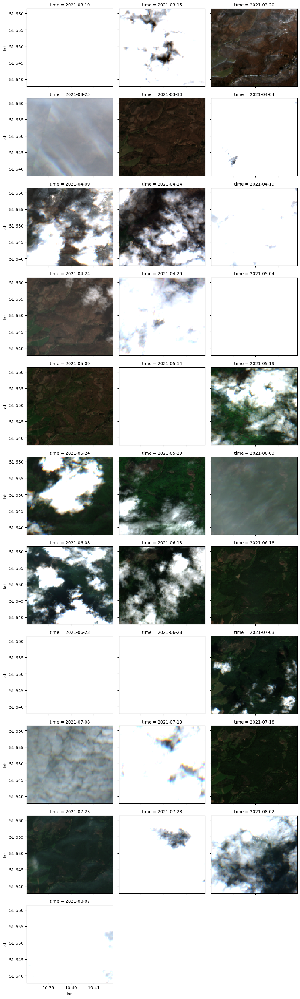

In [14]:
bands = ['TG', 'TN', 'TX', 'RR', 'PP', 'HU', 'FG', 'QQ']
paths = ["C:/Users/dozhang/Downloads/tg_ens_mean_0.1deg_reg_v26.0e.nc", 
         "C:/Users/dozhang/Downloads/tn_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/tx_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/rr_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/pp_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/hu_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/fg_ens_mean_0.1deg_reg_v26.0e.nc",
         "C:/Users/dozhang/Downloads/qq_ens_mean_0.1deg_reg_v26.0e.nc"]
bands_dict = dict(zip(bands, paths))
specs = {
    "lon_lat": (10.40, 51.65), # center pixel
    "xy_shape": (128, 128), # width, height of cutout around center pixel
    "resolution": 20, # in meters.. will use this on a local UTM grid..
    "time_interval": "2021-03-10/2021-08-07",
    "providers": [
        {
            "name": "s2",
            "kwargs": {
                "bands": ["B02", "B03", "B04", "B8A", "SCL"],  # , "B09", "B11", "B12"],
                "best_orbit_filter": False,
                "five_daily_filter": True,
                "brdf_correction": False,
                "cloud_mask": True,
                "cloud_mask_rescale_factor": 2,
                "aws_bucket": "planetary_computer",
            },
        },

        #     # RasterioIOError('CURL error: schannel: CertGetCertificateChain trust error CERT_TRUST_IS_UNTRUSTED_ROOT')
        #     # {"name": "srtm", "kwargs": {"bands": ["dem"]}},
            
            {"name": "nasa", "kwargs": {}},
            {"name": "alos", "kwargs": {}},
            {"name": "cop", "kwargs": {}},
        {
            "name": "esawc",
            "kwargs": {"bands": ["lc"], "aws_bucket": "planetary_computer"},
        },
        {
            "name": "geom",
            "kwargs": {"filepath": "C:/Users/dozhang/Downloads/geom_90M_n50e010.tif"}
        },
        {
            "name": "eobs",
            "kwargs": {"bands": bands_dict}
        }
    ],
}
# sitecube = emc.Minicuber.save_minicube(specs,"C:/Users/dozhang/Downloads/MJJ_replicated_minicube_124_32UNG_55.50_10.70(10.6998).nc")
site120 = emc.load_minicube(specs, compute = True)
# site124 = site124.drop_sel(time="2021-03-10T00:00:00")
# site120 = xr.open_dataset(r"E:\DZ\forest_dominated\ood-t_chopped\minicube_120_32UNC_51.65_10.40_f0.97_c0.00_s0.03.nc")
# site124 = xr.open_dataset("E:/DZ/greenearthnet/ood-t_chopped/MJJ21/minicube_124_32UNG_55.50_10.70.nc")
emc.plot_rgb(site120, mask=False)
site120


In [16]:
mc120 = xr.open_dataset(r"C:\Users\dozhang\Downloads\offset\predictions\ood-t_chopped\MJJ_minicube_120_32UNC_51.65_10.40.nc")
mc120
# emc.plot_rgb(mc120, mask=False)

<xarray.Dataset> Size: 1MB
Dimensions:    (time: 20, lat: 128, lon: 128)
Coordinates:
  * time       (time) datetime64[ns] 160B 2021-05-04 2021-05-09 ... 2021-08-07
  * lat        (lat) float64 1kB 51.66 51.66 51.66 51.66 ... 51.64 51.64 51.64
  * lon        (lon) float64 1kB 10.38 10.38 10.38 10.38 ... 10.42 10.42 10.42
Data variables:
    ndvi_pred  (time, lat, lon) float32 1MB ...

In [6]:
eobs = xr.open_dataset("C://Users//dozhang//Downloads//tg_ens_mean_0.1deg_reg_v26.0e.nc")
# print(eobs.sel(latitude = 55.50, longitude = 10.70, method="nearest").sel(time=slice("2003-03-10", "2003-03-20"))["tg"].values)
print(eobs) 
# print("lon min,max:", eobs.longitude.min().item(), eobs.longitude.max().item())
# print("lat min,max:", eobs.latitude.min().item(), eobs.latitude.max().item())
print(eobs.sel(latitude = 55.5, longitude = 10.6998, method="nearest").sel(time=slice("2003-03-10", "2003-03-20"))["tg"].values)

<xarray.Dataset> Size: 35GB
Dimensions:    (latitude: 465, longitude: 705, time: 26479)
Coordinates:
  * latitude   (latitude) float64 4kB 25.05 25.15 25.25 ... 71.25 71.35 71.45
  * longitude  (longitude) float64 6kB -24.95 -24.85 -24.75 ... 45.35 45.45
  * time       (time) datetime64[ns] 212kB 1950-01-01 1950-01-02 ... 2022-06-30
Data variables:
    tg         (time, latitude, longitude) float32 35GB ...
Attributes:
    E-OBS_version:  26.0e
    Conventions:    CF-1.4
    References:     http://surfobs.climate.copernicus.eu/dataaccess/access_eo...
    history:        Thu Sep 29 13:18:57 2022: ncks --no-abc -d time,0,26478 /...
    NCO:            netCDF Operators version 4.7.5 (Homepage = http://nco.sf....
[6.8399997 5.96      5.4       3.83      3.8799999 4.43      5.21
 5.5699997 5.65      5.46      3.54     ]


In [35]:
output = xr.open_dataset("E:\DZ\predictions\contextformer6M_seed42\JAS21\minicube_0_29SND_39.29_-8.56.nc")
output

<xarray.Dataset> Size: 1MB
Dimensions:    (time: 20, lat: 128, lon: 128)
Coordinates:
  * time       (time) datetime64[ns] 160B 2021-07-03 2021-07-08 ... 2021-10-06
  * lat        (lat) float64 1kB 39.3 39.3 39.3 39.3 ... 39.28 39.28 39.28 39.28
  * lon        (lon) float64 1kB -8.571 -8.571 -8.571 ... -8.542 -8.542 -8.542
Data variables:
    ndvi_pred  (time, lat, lon) float32 1MB ...

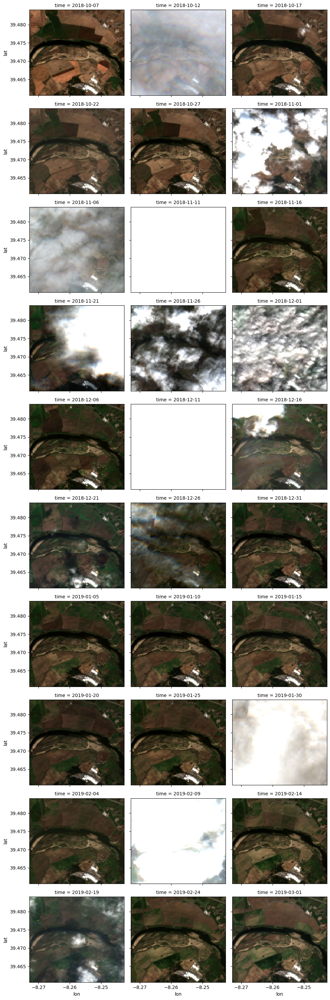

In [7]:
st1 = xr.open_dataset(r"E:\DZ\greenearthnet\train\29SND\crop_dominated\29SND_2018-10-03_2019-03-01_1465_1593_3129_3257_22_102_48_128_f0.05_c0.37_s0.35.nc")
emc.plot_rgb(st1, mask=False)
# st1

In [10]:
ndvitest = xr.open_dataset(r"E:\DZ\predictions\contextformer6M_seed42\MJJ21\minicube_0_29SND_39.29_-8.56.nc")
# emc.plot_rgb(ndvitest)
ndvitest

<xarray.Dataset> Size: 1MB
Dimensions:    (time: 20, lat: 128, lon: 128)
Coordinates:
  * time       (time) datetime64[ns] 160B 2021-05-04 2021-05-09 ... 2021-08-07
  * lat        (lat) float64 1kB 39.3 39.3 39.3 39.3 ... 39.28 39.28 39.28 39.28
  * lon        (lon) float64 1kB -8.571 -8.571 -8.571 ... -8.542 -8.542 -8.542
Data variables:
    ndvi_pred  (time, lat, lon) float32 1MB ...

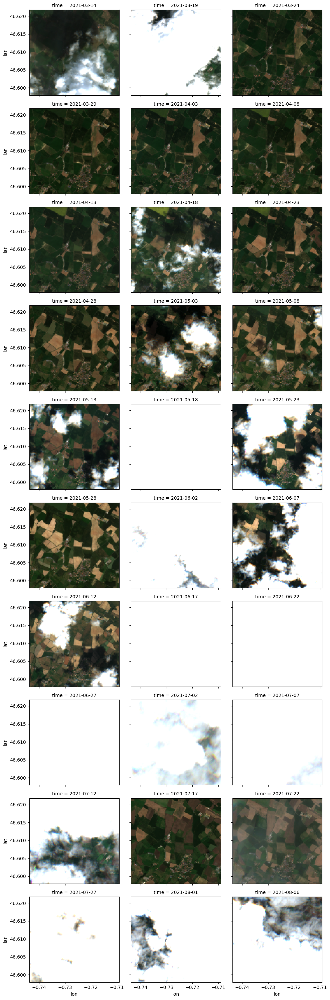

In [24]:
st2 = xr.open_dataset(r"E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_36_30TXS_46.61_-0.73.nc")
# r"E:\DZ\greenearthnet\train\29SND\29SND_2017-06-20_2017-11-16_1209_1337_5049_5177_18_98_78_158.nc"
emc.plot_rgb(st2, mask=False)
# st2 = xr.open_dataset(r"E:\DZ\predictions\split\MJJ21\0-9\minicube_0_29SND_39.29_-8.56_1.tiff")

# st2

# Folium plot

In [33]:
def map(minicube):
    x_min, x_max, y_min, y_max = minicube.lon[0].values, minicube.lon[-1].values, minicube.lat[-1].values, minicube.lat[0].values
    # Create map
    interactive_map = folium.Map(
        location=((y_min+y_max)/2, (x_min+x_max)/2),
        zoom_start=min(int((np.log(1000 / (x_max-x_min)) / np.log(2))), int((np.log(1000 / (y_max-y_min)) / np.log(2)))),
        tiles="http://mt1.google.com/vt/lyrs=y&z={z}&x={x}&y={y}",
        attr="Google",
        prefer_canvas=True,
    )
    
    folium.TileLayer('openstreetmap', show=False).add_to(interactive_map)
    
    # Create bounding box coordinates to overlay on map
    line_segments = [
        (y_min, x_min),
        (y_min, x_max),
        (y_max, x_max),
        (y_max, x_min),
        (y_min, x_min),
    ]

    # Add bounding box as an overlay
    interactive_map.add_child(
        folium.features.PolyLine(locations=line_segments, color="red", opacity=0.8)
    )
    #folium.PolyLine(locations=line_segments, color="red", opacity=0.8).add_to(interactive_map)
    
    return interactive_map

In [34]:
# PARAMS
S2_t = 1

In [35]:
rgb = cube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").isel(time=S2_t).to_numpy()
rgb = np.nan_to_num(rgb, nan=0.0)
rgb = np.swapaxes(rgb, 0, 2)
rgb = np.swapaxes(rgb, 0, 1)

In [36]:
nasadem = cube.nasa_dem.to_numpy()
nasadem = (nasadem-np.nanmin(nasadem))/np.nanmax(nasadem) #minmax scale
nasadem = np.nan_to_num(nasadem, nan=np.nanmean(nasadem))

alos = cube.alos_dem.to_numpy()
alos = (alos-np.nanmin(alos))/np.nanmax(alos) #minmax scale
alos = np.nan_to_num(alos, nan=np.nanmean(alos))

cop = cube.cop_dem.to_numpy()
cop = (cop-np.nanmin(cop))/np.nanmax(cop) #minmax scale
cop = np.nan_to_num(cop, nan=np.nanmean(cop))


mask = cube["s2_mask"].isel(time=S2_t).where(lambda x: x>0).to_numpy()
mask = np.nan_to_num(mask, nan=0.0)


lc = cube.esawc_lc.to_numpy()
lc = np.nan_to_num(lc, nan=0.0)

tg = cube.eobs_tg.to_numpy()
tg = np.nan_to_num(tg, nan=0.0)

tn = cube.eobs_tn.to_numpy()
tn = np.nan_to_num(tn, nan=0.0)

tx = cube.eobs_tx.to_numpy()
tx = np.nan_to_num(tx, nan=0.0)

rr = cube.eobs_rr.to_numpy()
rr = np.nan_to_num(rr, nan=0.0)

pp = cube.eobs_pp.to_numpy()
pp = np.nan_to_num(pp, nan=0.0)

hu = cube.eobs_hu.to_numpy()
hu = np.nan_to_num(hu, nan=0.0)

fg = cube.eobs_fg.to_numpy()
fg = np.nan_to_num(fg, nan=0.0)

qq = cube.eobs_qq.to_numpy()
qq = np.nan_to_num(qq, nan=0.0)

# ndvi_clims=[]
# for i in range(12):
#     clim = cube.ndviclim_mean.isel(time_clim=i).to_numpy()
#     clim = np.nan_to_num(clim, nan=0.0)
#     month = datetime.datetime.strptime(str(i+1), "%m").strftime("%b")
#     ndvi_clims.append({"month": month, "ndvi_mean": clim})


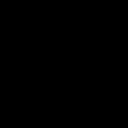
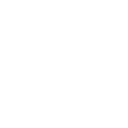
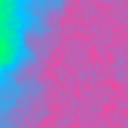
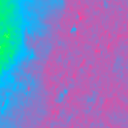
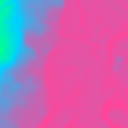
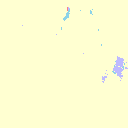

In [37]:
interactive_map = map(cube)

bounds = [[float(cube.lat[-1].values), float(cube.lon[0].values)], [float(cube.lat[0].values), float(cube.lon[-1].values)]]

# Add RGB layer
folium.raster_layers.ImageOverlay(
    image=rgb,
    bounds=bounds,
    mercator_project=True,
    name="Sentinel 2 RGB",
    opacity=0.95,
).add_to(interactive_map)

# Add cloud layer
folium.raster_layers.ImageOverlay(
    image=mask,
    bounds=bounds,
    mercator_project=True,
    name="S2 Mask",
    colormap = lambda x: (1, x/10, -x/2, x),
).add_to(interactive_map)


# Add NASADEM
folium.raster_layers.ImageOverlay(
    image=nasadem,
    bounds=bounds,
    mercator_project=True,
    name="NASADEM",
    opacity=0.75,
    show=False,
    colormap = plt.get_cmap("terrain"),
).add_to(interactive_map)

# Add ALOS
folium.raster_layers.ImageOverlay(
    image=alos,
    bounds=bounds,
    mercator_project=True,
    name="ALOS",
    opacity=0.75,
    show=False,
    colormap = plt.get_cmap("terrain"),
).add_to(interactive_map)


# Add COP
folium.raster_layers.ImageOverlay(
    image=cop,
    bounds=bounds,
    mercator_project=True,
    name="COP",
    opacity=0.75,
    show=False,
    colormap = plt.get_cmap("terrain"),
).add_to(interactive_map)

# Add ESA-WC
folium.raster_layers.ImageOverlay(
    image=lc/255,
    bounds=bounds,
    mercator_project=True,
    name="ESA WorldCover",
    opacity=0.8,
    show=False,
    colormap = plt.get_cmap("Set3"),
).add_to(interactive_map)

# # Add NDVI Climatology
# for clim in ndvi_clims:
#     folium.raster_layers.ImageOverlay(
#         image=clim['ndvi_mean'],
#         bounds=bounds,
#         mercator_project=True,
#         name=f"NDVI {clim['month']}",
#         opacity=0.9,
#         show=False,
#         colormap = cmap_veg,
#     ).add_to(interactive_map)
    
folium.map.LayerControl(position='topright', collapsed=False, autoZIndex=True).add_to(interactive_map)

interactive_map

# Other Plots

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07337819654909761..1.188879171500157].


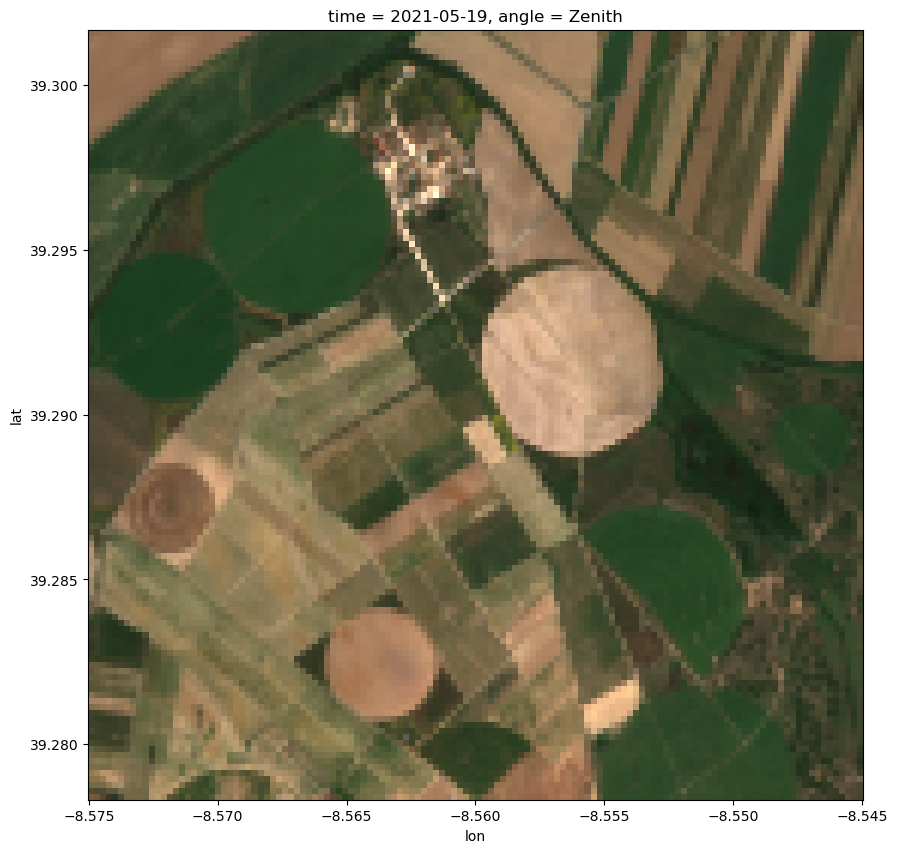

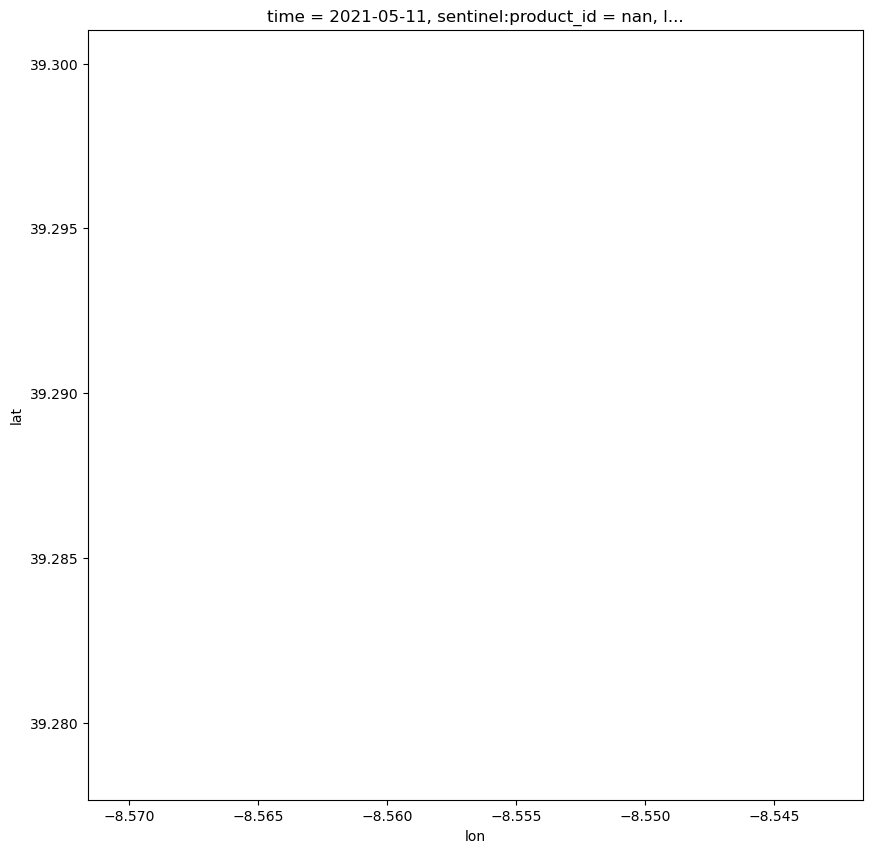

In [19]:
rgb_brightness_scaling=3

(cube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").isel(time = S2_t) * rgb_brightness_scaling).plot.imshow(rgb="band", figsize = (10, 10))
(input[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").isel(time = S2_t) * rgb_brightness_scaling).plot.imshow(rgb="band", figsize = (10, 10))

In [85]:
# sweden
# emc.plot_rgb(sweden, mask=True)
# emc.plot_rgb(sweden, mask=False)
swedeninput = xr.open_dataset("E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_241_34VCL_59.04_17.96.nc")
# emc.plot_rgb(swedeninput.rename({"s2_dlmask": "s2_mask"}), mask=True)

In [82]:
sweden

<xarray.Dataset> Size: 118MB
Dimensions:   (time: 150, lon: 128, lat: 128)
Coordinates:
  * time      (time) datetime64[ns] 1kB 2021-03-10 2021-03-11 ... 2021-08-06
  * lon       (lon) float64 1kB 17.94 17.94 17.94 17.94 ... 17.98 17.98 17.98
  * lat       (lat) float64 1kB 59.05 59.05 59.05 59.05 ... 59.03 59.03 59.03
Data variables: (12/20)
    s2_SCL    (time, lat, lon) float64 20MB nan nan nan nan ... 4.0 4.0 4.0 4.0
    s2_mask   (time, lat, lon) float64 20MB nan nan nan nan ... 0.0 0.0 0.0 0.0
    s2_avail  (time) float32 600B nan nan nan nan 1.0 ... nan nan nan nan 1.0
    s2_B02    (time, lat, lon) float64 20MB nan nan nan ... 0.03479 0.04214
    s2_B03    (time, lat, lon) float64 20MB nan nan nan ... 0.04766 0.05559
    s2_B04    (time, lat, lon) float64 20MB nan nan nan ... 0.03548 0.04569
    ...        ...
    eobs_qq   (time) float32 600B 95.0 37.0 66.0 50.0 ... 247.0 264.0 250.0
    nasa_dem  (lat, lon) float64 131kB 49.39 50.44 51.4 ... 44.56 43.62 42.57
    alos_dem  (lat, lon) float64 131kB 49.29 51.33 54.69 ... 44.55 43.72 42.15
    cop_dem   (lat, lon) float64 131kB 50.67 52.94 54.55 ... 43.53 42.25 41.5
    esawc_lc  (lat, lon) float32 66kB 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0
    geom_cls  (lat, lon) float32 66kB 7.0 7.0 7.0 7.0 7.0 ... 3.0 5.0 5.0 5.0
Attributes:
    history:  Created on 2025-10-07 19:28:13.541145 with the earthnet-minicub...

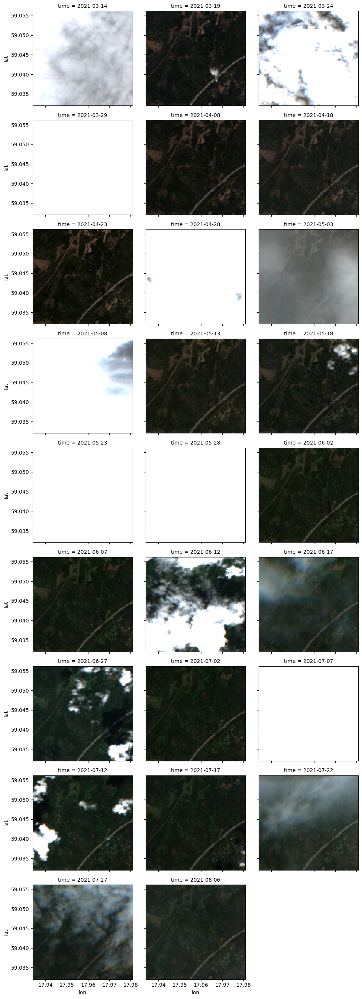

In [103]:
swedeninput
emc.plot_rgb(swedeninput.rename({"s2_dlmask": "s2_mask"}), mask=False)

In [28]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# ESA WorldCover legend (class value → label)
classes = {
    10: "Tree cover",
    20: "Shrubland",
    30: "Grassland",
    40: "Cropland",
    50: "Built-up",
    60: "Bare/sparse vegetation",
    70: "Snow and ice",
    80: "Permanent water bodies",
    90: "Herbaceous wetland",
    95: "Mangroves",
    100: "Moss and lichen",
}

# Official ESA color codes
colors = [
    "#006400",  # Tree cover
    "#ffbb22",  # Shrubland
    "#ffff4c",  # Grassland
    "#f096ff",  # Cropland
    "#fa0000",  # Built-up
    "#b4b4b4",  # Bare/sparse vegetation
    "#f0f0f0",  # Snow and ice
    "#0064c8",  # Water bodies
    "#0096a0",  # Wetlands
    "#00cf75",  # Mangroves
    "#fae6a0",  # Moss and lichen
]

# Create discrete colormap and normalization
cmap = mcolors.ListedColormap(colors)
bounds = np.array(list(classes.keys()) + [110])  # upper bound beyond last class
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Function to plot any xarray DataArray containing WorldCover data
def plot_worldcover(data, title="ESA WorldCover Classification"):
    plt.figure(figsize=(12, 10))
    im = data.esawc_lc.plot.imshow(cmap=cmap, norm=norm, add_colorbar=False)
    
    # Custom legend
    patches = [
        plt.plot([], [], marker="s", ls="", color=colors[i], label=list(classes.values())[i])[0]
        for i in range(len(classes))
    ]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming you loaded the data as an xarray DataArray (e.g., from rioxarray)
# wc = xr.open_rasterio("ESA_WorldCover_2021_v200_N39W009_Map.tif").squeeze()
# plot_worldcover(wc)
# plot_worldcover(harvard)


In [27]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Geomorphon landform classes (1–10/11 depending on dataset)
classes = {
    1: "Flat",
    2: "Peak",
    3: "Ridge",
    4: "Shoulder",
    5: "Spur",
    6: "Slope",
    7: "Hollow",
    8: "Footslope",
    9: "Valley",
    10: "Pit",
}

# Assign a color to each class
colors = [
    "#f7f7f7",  # Flat
    "#d73027",  # Peak
    "#fc8d59",  # Ridge
    "#fee090",  # Shoulder
    "#e0f3f8",  # Spur
    "#91bfdb",  # Slope
    "#4575b4",  # Hollow
    "#ffffbf",  # Footslope
    "#a6d96a",  # Valley
    "#1a9850",  # Pit
]

# Discrete colormap
cmap = mcolors.ListedColormap(colors)
bounds = list(classes.keys())
norm = mcolors.BoundaryNorm(bounds + [bounds[-1] + 1], cmap.N)

# Plot
def plot_geomorphons(data, title="Geomorphons Landform Classification"):
    plt.figure(figsize=(12, 10))
    im = data.geom_cls.plot.imshow(cmap=cmap, norm=norm, add_colorbar=False)

    # Custom legend
    patches = [plt.plot([], [], marker="s", ls="", color=colors[i-1],
                        label=classes[i])[0] for i in classes]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(title)
    plt.show()

# plot_geomorphons(harvard)

# # Plot
# plt.figure(figsize=(12, 10))
# im = input.geom_cls.plot.imshow(cmap=cmap, norm=norm, add_colorbar=False)

# # Custom legend
# patches = [plt.plot([], [], marker="s", ls="", color=colors[i-1],
#                     label=classes[i])[0] for i in classes]
# plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.title("Geomorphons Landform Classification")
# plt.show()



In [26]:
# sweden.nasa_dem.plot.imshow(figsize = (12, 10))


In [25]:
# sweden.alos_dem.plot.imshow(figsize = (12, 10))
# input.alos_dem.plot.imshow(figsize = (12, 10))

In [23]:
# sweden.cop_dem.plot.imshow(figsize = (12, 10))
# input.cop_dem.plot.imshow(figsize = (12, 10))

In [24]:
# input[["eobs_tg","eobs_tn","eobs_tx"]].to_array("band").plot(hue = "band")

<xarray.Dataset> Size: 119MB
Dimensions:              (time: 150, lon: 128, lat: 128)
Coordinates:
  * time                 (time) datetime64[ns] 1kB 2021-03-11 ... 2021-08-07
  * lon                  (lon) float64 1kB 10.68 10.68 10.68 ... 10.72 10.72
  * lat                  (lat) float64 1kB 55.51 55.51 55.51 ... 55.49 55.49
    sentinel:product_id  float64 8B ...
    latitude_eobs        float64 8B ...
    longitude_eobs       float64 8B ...
Data variables: (12/21)
    s2_SCL               (time, lat, lon) float64 20MB ...
    s2_avail             (time) float64 1kB ...
    s2_B02               (time, lat, lon) float64 20MB ...
    s2_B03               (time, lat, lon) float64 20MB ...
    s2_B04               (time, lat, lon) float64 20MB ...
    s2_B8A               (time, lat, lon) float64 20MB ...
    ...                   ...
    eobs_rr              (time) float64 1kB ...
    eobs_tg              (time) float64 1kB ...
    eobs_tn              (time) float64 1kB ...
    eobs_tx              (time) float64 1kB ...
    s2_dlmask            (time, lat, lon) float64 20MB ...
    eobs_fgv26           (time) float64 1kB ...
Attributes:
    dataset_name:        EarthNet2021x
    dataset_name_short:  en21x
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2021x dataset, a...
    provided_by:         Max-Planck-Institute for Biogeochemistry

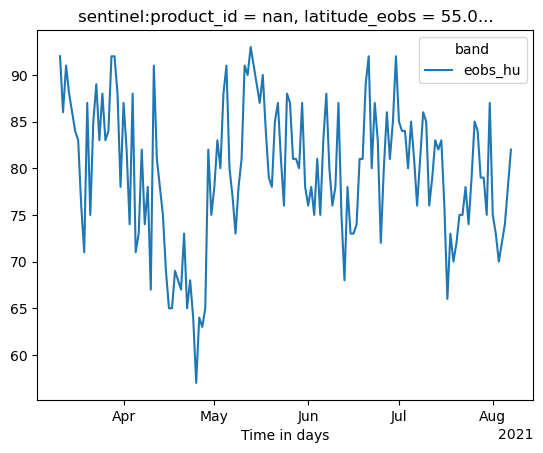

In [37]:
# cube[["eobs_tg","eobs_tn","eobs_tx"]].to_array("band").plot(hue = "band")
site = xr.open_dataset(r"E:\DZ\greenearthnet\ood-t_chopped\MJJ21\minicube_124_32UNG_55.50_10.70.nc")
# site[["eobs_tg","eobs_tn","eobs_tx"]].to_array("band").plot(hue = "band")
# site[["eobs_rr"]].to_array("band").plot(hue = "band")
site[["eobs_hu"]].to_array("band").plot(hue = "band")
site